In [1]:
import matplotlib.pyplot as plt
import networkx as nx
import pickle
from networkx.algorithms.community.centrality import girvan_newman
from networkx.algorithms.community.kernighan_lin import kernighan_lin_bisection as kernighan
from networkx.algorithms.community import modularity

In [2]:
with open('output/nodes.pickle', 'rb') as f:
    nodes_list = pickle.load(f)

with open('output/edges.pickle', 'rb') as f:
    edges_list = pickle.load(f)

print('nodes:', len(nodes_list), ', edges (doubled):', len(edges_list))

nodes: 520 , edges (doubled): 21574


In [3]:
with open('output/nodes.pickle', 'rb') as f:
    nodes_list = pickle.load(f)
with open('output/edges.pickle', 'rb') as f:
    edges_list = pickle.load(f)

print('nodes:', len(nodes_list), ', edges (x2):', len(edges_list))

nodes: 520 , edges (x2): 21574


In [4]:
g = nx.Graph(name='DDNet_Teamranks')
g.add_nodes_from(nodes_list)
g.add_weighted_edges_from(edges_list)
print(g.number_of_edges(), g.number_of_nodes(), g.name)

10787 520 DDNet_Teamranks


In [5]:
wts = [x[1]['weight'] for x in g.nodes.data()]
n_labels = nx.get_node_attributes(g, 'labels')
n = g.number_of_nodes()

k_custom = 3 / (n ** 0.5)
n_size = [(2000 * x) for x in wts]

edge_w = [5 * x[2]['weight'] for x in g.edges.data()]

D:\PycharmProjects\DDNet_Social_graph\venv\lib\site-packages\matplotlib\backends\backend_agg.py:240: RuntimeWarning: Glyph 158 missing from current font.
  font.set_text(s, 0.0, flags=flags)
D:\PycharmProjects\DDNet_Social_graph\venv\lib\site-packages\matplotlib\backends\backend_agg.py:203: RuntimeWarning: Glyph 158 missing from current font.
  font.set_text(s, 0, flags=flags)
D:\PycharmProjects\DDNet_Social_graph\venv\lib\site-packages\matplotlib\backends\backend_agg.py:240: RuntimeWarning: Glyph 136 missing from current font.
  font.set_text(s, 0.0, flags=flags)
D:\PycharmProjects\DDNet_Social_graph\venv\lib\site-packages\matplotlib\backends\backend_agg.py:203: RuntimeWarning: Glyph 136 missing from current font.
  font.set_text(s, 0, flags=flags)
D:\PycharmProjects\DDNet_Social_graph\venv\lib\site-packages\matplotlib\backends\backend_agg.py:240: RuntimeWarning: Glyph 150 missing from current font.
  font.set_text(s, 0.0, flags=flags)
D:\PycharmProjects\DDNet_Social_graph\venv\lib\si

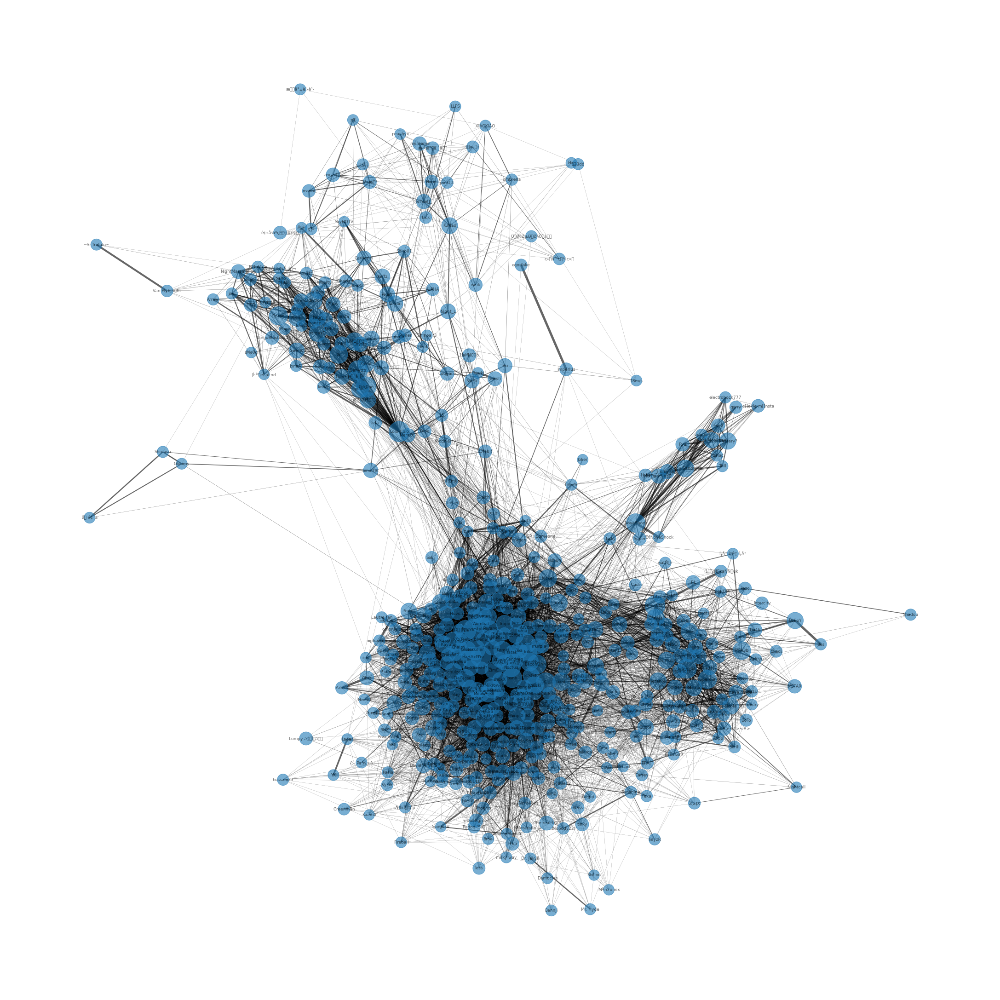

In [6]:
pos_ = nx.drawing.layout.spring_layout(g, k=k_custom, weight='weight')

plt.figure(figsize = (30, 30))
nx.draw(g, pos=pos_, node_size=n_size, labels=n_labels, font_size=9,
        alpha=0.6, width=edge_w, with_labels=True)
plt.savefig('output_plots/g_small.png');

График распределения степеней вершин

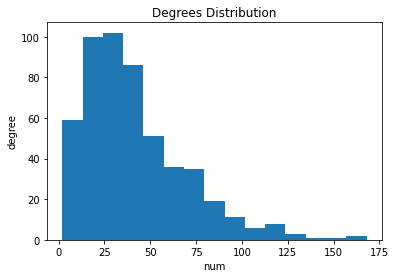

In [7]:
deg = [x[1] for x in list(nx.degree(g))]

plt.title("Degrees Distribution")
plt.xlabel('num')
plt.ylabel('degree')
plt.hist(deg, bins=15)
plt.savefig('output_plots/deg.png')

In [8]:
# Степень посредничества, мосты
# Кратчайшие пути между узлами
betw_centrality = nx.betweenness_centrality(g)
sorted_betw = sorted(betw_centrality.items(), key=lambda x: x[1], reverse=True)[:20]
for i, (num, betw_c) in enumerate(sorted_betw):
    print(i+1, n_labels[num], round(betw_c, 4))

1 brainless tee 0.1238
2 (1) 0.0531
3 Kicker 0.033
4 nameless tee 0.032
5 zattttt 0.0293
6 Colo-Colo 0.0273
7 fikmesÃ¥n 0.025
8 Cendren 0.0216
9 Noctua 0.0171
10 Saki` 0.0168
11 bano 0.0157
12 Cireme 0.0146
13 Night_L 0.0146
14 950 0.0146
15 jao 0.0129
16 triki 0.0122
17 <BÂµmM> 0.0116
18 SiuFu 0.0112
19 Eki 0.0105
20 xXxTee' 0.0104


In [9]:
# Степень близости — это мера центральности в сети,
# вычисляемая как обратная величина суммы длин кратчайших путей между узлом и
# всеми другими узлами графа. Таким образом, чем более централен узел,
# тем ближе он ко всем другим узлам.

clos_centrality = nx.closeness_centrality(g)
sorted_clos = sorted(clos_centrality.items(), key=lambda x: x[1], reverse=True)[:20]
for i, (num, clos_c) in enumerate(sorted_clos):
    print(i+1, n_labels[num], round(clos_c, 4))

1 brainless tee 0.5678
2 Cendren 0.5557
3 Noctua 0.5521
4 bano 0.5446
5 fikmesÃ¥n 0.5435
6 nameless tee 0.5389
7 <BÂµmM> 0.534
8 (1) 0.534
9 Cireme 0.5285
10 iParano 0.528
11 triki 0.5258
12 HaHAxD* 0.5216
13 Kicker 0.5211
14 Aoe 0.5185
15 Freezestyler 0.5169
16 Chairn 0.5108
17 shoxX 0.5108
18 ZimE 0.5108
19 :) 0.5103
20 jao 0.5093


In [10]:
# Гармоническая центральность

all_nodes = set(g.nodes())
harmonic_cent = []

for x in all_nodes:
    h_cent = 0
    for y in (all_nodes - {x}):
        h_cent += 1 / nx.shortest_path_length(g, source=x, target=y)
    harmonic_cent.append((x, h_cent))

sorted_harm = sorted(harmonic_cent, key=lambda x: x[1], reverse=True)[:20]
for i, (num, harm_c) in enumerate(sorted_harm):
    print(i+1, n_labels[num], round(harm_c, 4))

1 Noctua 332.1667
2 Cendren 331.8333
3 brainless tee 326.8333
4 bano 323.8333
5 fikmesÃ¥n 315.4167
6 <BÂµmM> 313.9167
7 iParano 310.0
8 Cireme 309.5833
9 nameless tee 309.0833
10 HaHAxD* 307.4167
11 triki 307.0
12 Kicker 306.9833
13 KlexMikrowelle 306.3167
14 Freezestyler 306.0667
15 Aoe 305.4167
16 (1) 305.0833
17 :) 300.0
18 Chairn 299.8333
19 BaconDrink 299.2
20 CÃ¸ke 298.3167


In [11]:
harm_centrality = nx.harmonic_centrality(g)
sorted_cent = sorted(harm_centrality.items(), key=lambda x: x[1], reverse=True)
for i, (num, harm_c) in enumerate(sorted_cent):
    if i == 20:
        break
    print(i+1, n_labels[num], round(harm_c, 4))

1 Noctua 332.1667
2 Cendren 331.8333
3 brainless tee 326.8333
4 bano 323.8333
5 fikmesÃ¥n 315.4167
6 <BÂµmM> 313.9167
7 iParano 310.0
8 Cireme 309.5833
9 nameless tee 309.0833
10 HaHAxD* 307.4167
11 triki 307.0
12 Kicker 306.9833
13 KlexMikrowelle 306.3167
14 Freezestyler 306.0667
15 Aoe 305.4167
16 (1) 305.0833
17 :) 300.0
18 Chairn 299.8333
19 BaconDrink 299.2
20 CÃ¸ke 298.3167


In [12]:
sorted_betw = [x[0] for x in sorted_betw]
sorted_clos = [x[0] for x in sorted_clos]
sorted_harm = [x[0] for x in sorted_harm]
print(sorted_harm)

[286, 253, 125, 117, 252, 51, 74, 34, 68, 165, 121, 254, 271, 66, 8, 57, 146, 6, 453, 13]


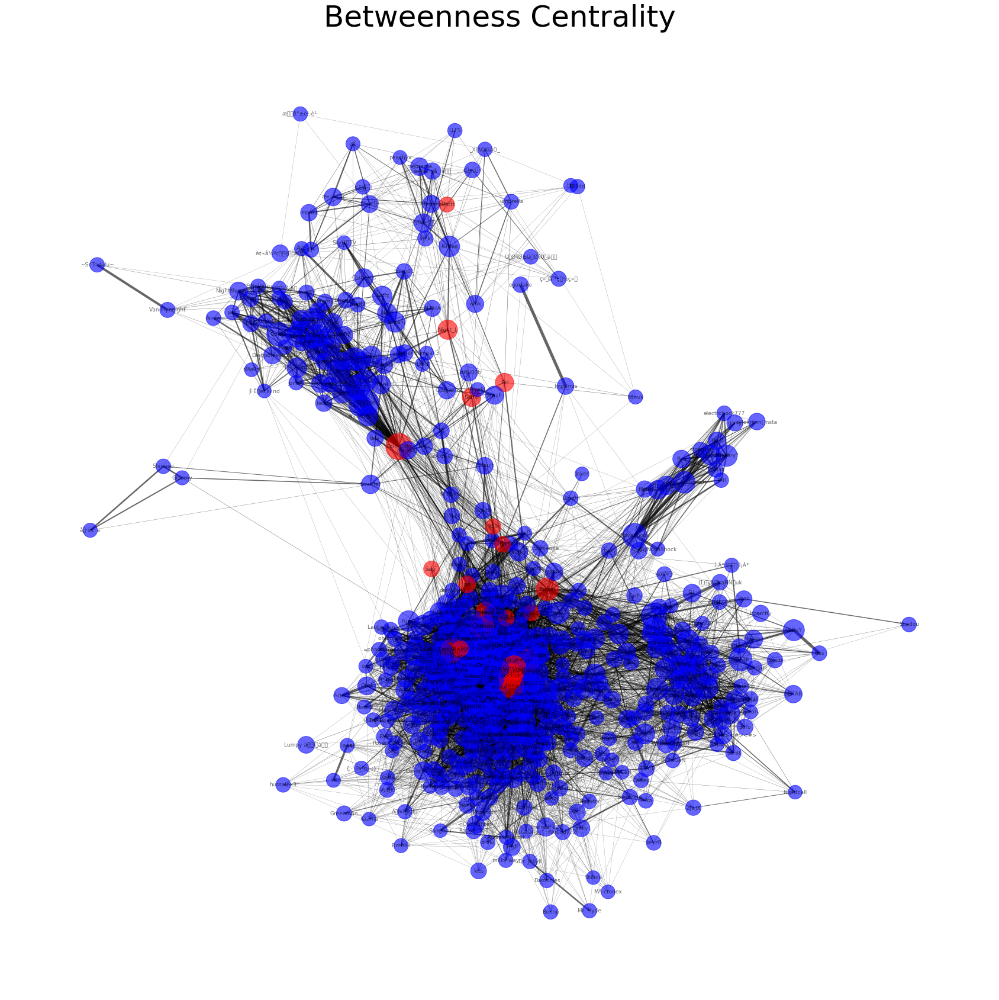

In [13]:
color_map = ['red' if node in sorted_betw else 'blue' for node in all_nodes]

plt.figure(figsize = (30, 30))
plt.title('Betweenness Centrality', fontdict = {'fontsize' : 50})
nx.draw(g, pos=pos_, node_size=n_size, node_color=color_map, labels=n_labels,
        font_size=9, alpha=0.6, width=edge_w, with_labels=True)
plt.savefig('output_plots/g_small_betw.png')


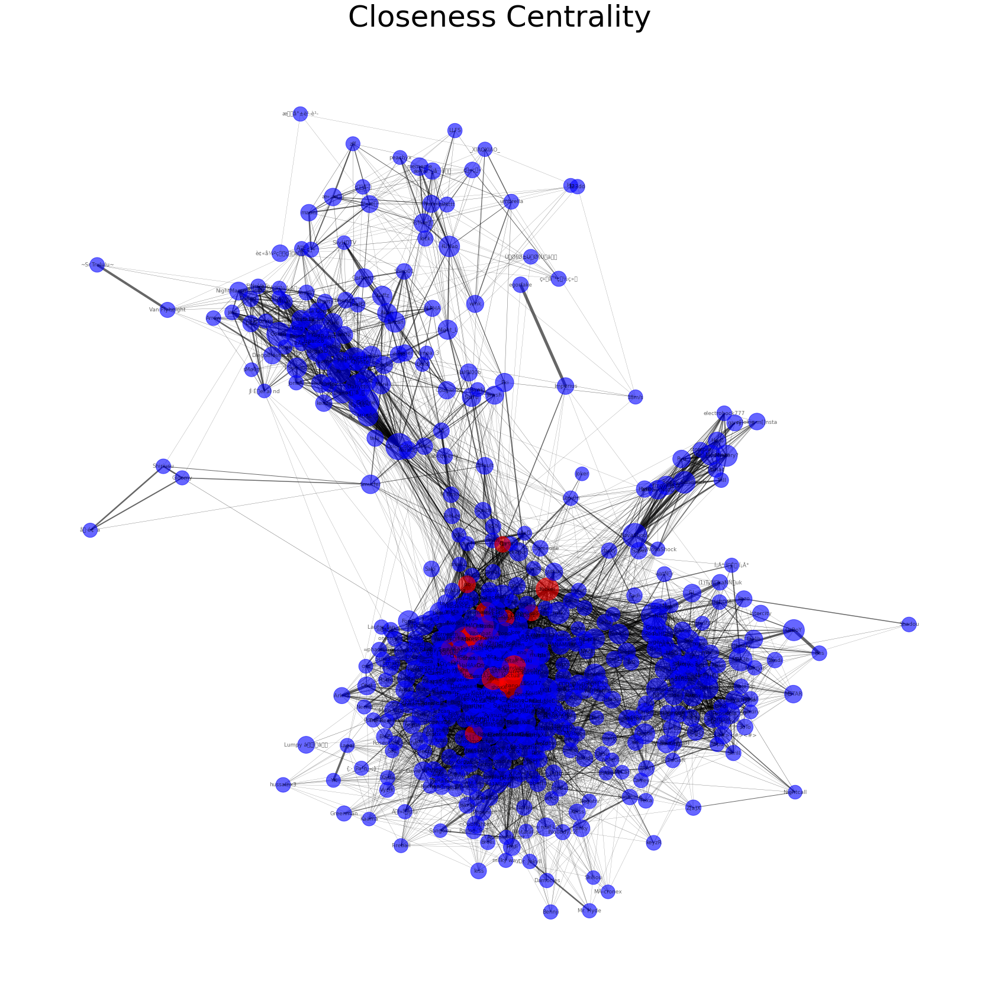

In [14]:
color_map = ['red' if node in sorted_clos else 'blue' for node in all_nodes]

plt.figure(figsize = (30, 30))
plt.title('Closeness Centrality', fontdict = {'fontsize' : 50})
nx.draw(g, pos=pos_, node_size=n_size, node_color=color_map, labels=n_labels,
        font_size=9, alpha=0.6, width=edge_w, with_labels=True)
plt.savefig('output_plots/g_small_clos.png')

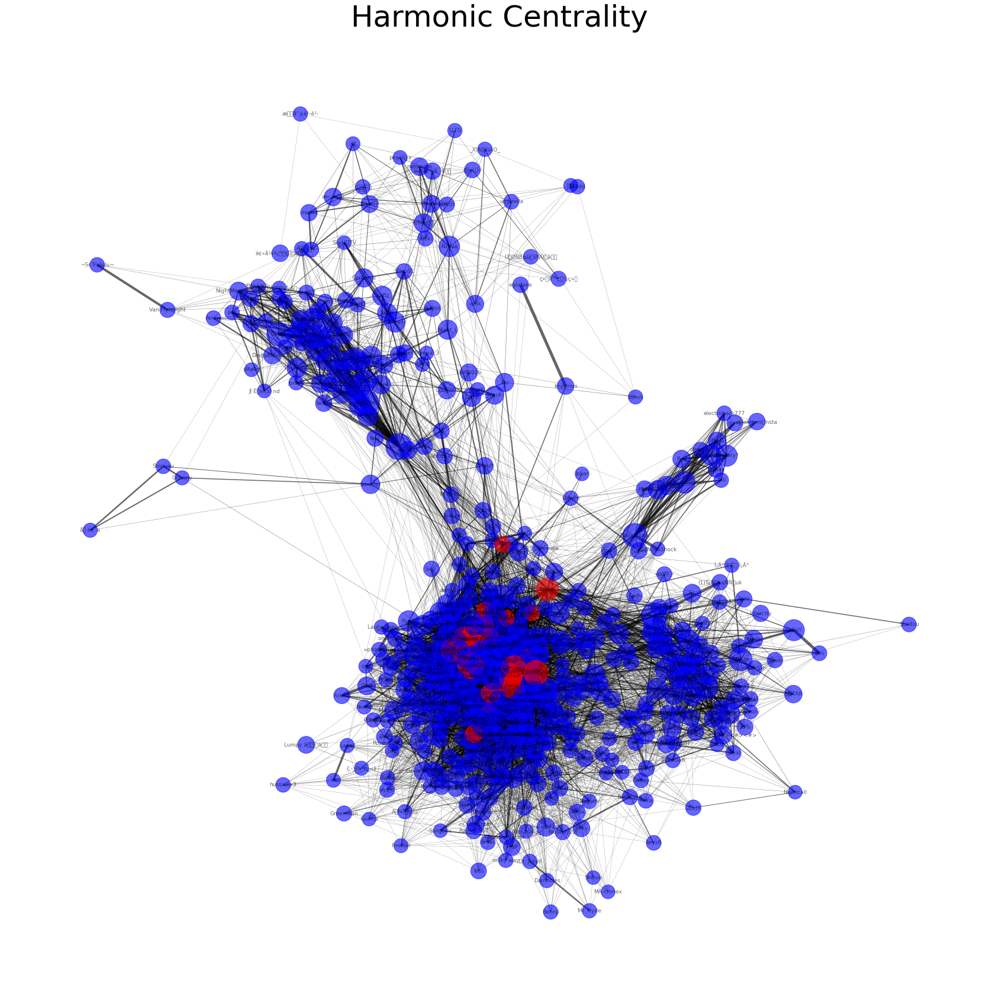

In [15]:
color_map = ['red' if node in sorted_harm else 'blue' for node in all_nodes]

plt.figure(figsize = (30, 30))
plt.title('Harmonic Centrality', fontdict = {'fontsize' : 50})
nx.draw(g, pos=pos_, node_size=n_size, node_color=color_map, labels=n_labels,
        font_size=9, alpha=0.6, width=edge_w, with_labels=True)
plt.savefig('output_plots/g_small_harm.png')

Узлы с высокой степенью посредничества (betweenness) ожидаемо лежат "между" кластерами, на путях из одного кластера в другой.
Узлы с высокой степенью близости лежат в центре крупнейшего кластера, чуть сместившись в сторону оставшихся на карте узлов.
Гармонические центральные точки тоже располагаются так, чтобы гармоническое среднее расстояний до всех остальных точек было минимальным.

In [16]:
com_gn = girvan_newman(g)

node_groups = []
for com in next(com_gn):
    node_groups.append(list(com))
print(len(node_groups))
mod = round(modularity(g, node_groups), 4)
print('Girvan-Newman partition. Modularity:', mod)

# color_map = ['green' if node in node_groups[0] else 'blue' for node in all_nodes]
#
# plt.figure(figsize = (30, 30))
# plt.suptitle('modularity = ' + str(mod),  fontsize=36)
# plt.title('Girvan-Newman', fontdict = {'fontsize' : 50})
#
# nx.draw(g, pos=pos_, node_size=n_size, node_color=color_map, labels=n_labels,
#         font_size=10, alpha=0.6, width=edge_w, with_labels=True)
# plt.savefig('output_plots/girvan_newman.png')

2
Girvan-Newman partition. Modularity: 0.0321


2


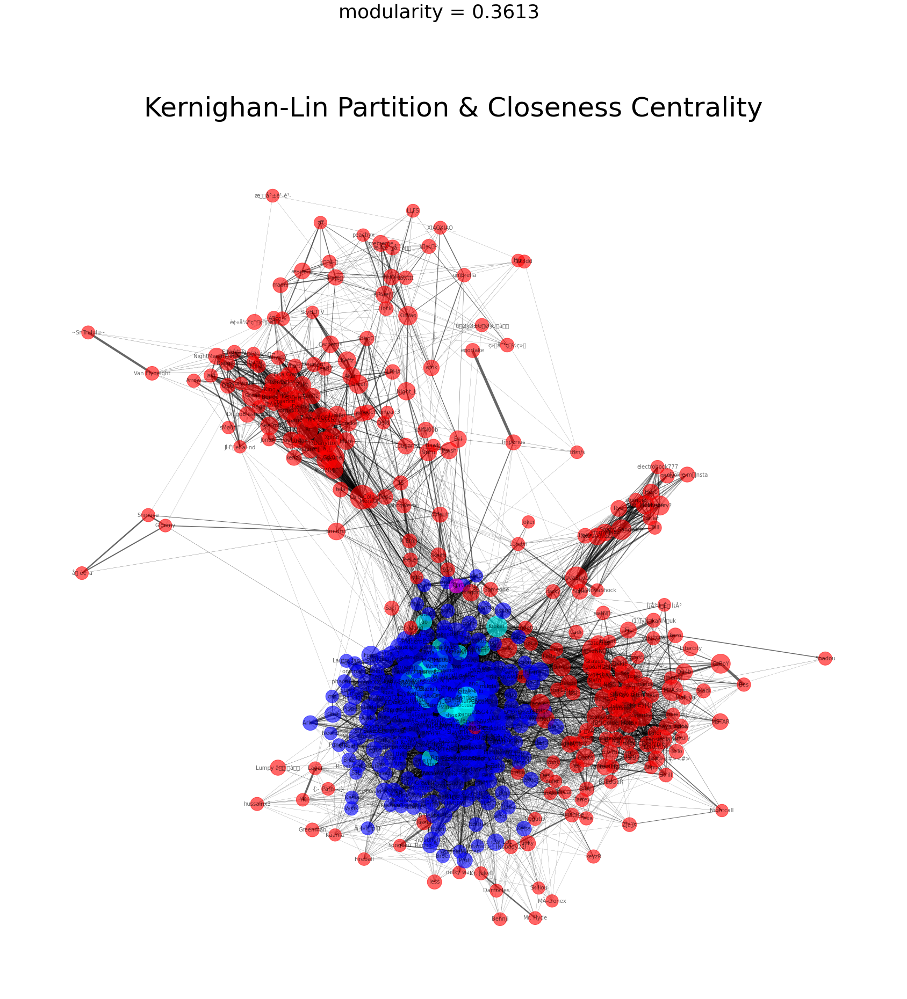

In [17]:
com_ker = kernighan(g)
node_groups_ker = [list(x) for x in com_ker]
print(len(node_groups_ker))

color_map_ker = []
for node in all_nodes:
    if node in node_groups_ker[0]:
        if node in sorted_clos:
            color_map_ker.append('cyan')
        else:
            color_map_ker.append('blue')
    else:
        if node in sorted_clos:
            color_map_ker.append('magenta')
        else:
            color_map_ker.append('red')

mod = round(modularity(g, node_groups_ker), 4)

plt.figure(figsize = (30, 30))
plt.suptitle('modularity = ' + str(mod),  fontsize=36)
plt.title('Kernighan-Lin Partition & Closeness Centrality', fontdict = {'fontsize' : 50})

nx.draw(g, pos_, node_size=n_size, node_color=color_map_ker, labels=n_labels,
        font_size=10, alpha=0.6, width=edge_w, with_labels=True)
plt.savefig('output_plots/kernighan_lin_closeness_cent.png');